# Optimal number of states

Inertia, silhouette and transition entropy over a sweep of the requested state count.
Extracted from `analysis_encode.ipynb`.


## Setup

In [1]:

import importlib
import os
import sys

import yaml

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [2]:
# Load configuration and find project root
if "PROJECT_ROOT" not in globals():
    PROJECT_ROOT = None
    for _p in [os.getcwd()] + sys.path:
        _curr = os.path.abspath(_p) if _p else ""
        while _curr and _curr != os.path.dirname(_curr):
            if os.path.exists(os.path.join(_curr, "scripts/analysis/analyze.py")):
                PROJECT_ROOT = _curr
                break
            _curr = os.path.dirname(_curr)
        if PROJECT_ROOT: break
    if not PROJECT_ROOT:
        PROJECT_ROOT = os.getcwd()

config_path = os.path.join(PROJECT_ROOT, "config_encode.yaml")
with open(config_path, "r") as f:
    config = yaml.safe_load(f)

scripts_dir = os.path.abspath(os.path.join(PROJECT_ROOT, "scripts", "analysis"))
scripts_rules_dir = os.path.abspath(os.path.join(PROJECT_ROOT, "scripts", "rules"))
scripts_root_dir = os.path.abspath(os.path.join(PROJECT_ROOT, "scripts"))
workdir = os.path.expanduser(config.get("workdir", "."))

In [3]:
# Import the analysis methods directly (no CLI / subprocess).
for _p in [scripts_root_dir, scripts_rules_dir, scripts_dir]:
    if _p not in sys.path:
        sys.path.insert(0, _p)

import analyze
import utils
from utils import (
    CHROMHMM, CHROMHMM_DEFAULT, HOMER, MACS2, OMNI, OMNI_DISPLAY
)

# Re-import the analysis modules so edits to scripts/analysis/*.py are picked up when this
# cell is re-run, without needing a kernel restart (plain `import` caches modules).
for _m in (analyze, utils):
    importlib.reload(_m)

# Display helpers, shared with the other analysis notebooks.
from display import show_group

# Run everything relative to the pipeline working directory.
os.chdir(workdir)
print(f"Project root: {PROJECT_ROOT}")
print(f"Scripts dir : {scripts_dir}")
print(f"Working dir : {workdir}")

Project root: /Users/Oleg.Shpynov/work/omni-chromhmm
Scripts dir : /Users/Oleg.Shpynov/work/omni-chromhmm/scripts/analysis
Working dir : /Users/Oleg.Shpynov/data/2026_segmentations/encode


In [4]:
# Parameters, mirroring the Snakefile.
P = config["params"]
TOOLS = config["tools"]
DATASETS = config["datasets"]
# Use 3 chipseq and 2 mint datasets only.
SELECTED_DATASETS = ["imr90", "monocytes", "spleen"]
DATASETS = {k: v for k, v in DATASETS.items() if k in SELECTED_DATASETS}
OUTLIERS = []
CHROMHMM_BIN = P["chromhmm_bin"]
NSTATES = P["n_states"]
DO_REPLICATES = P.get("replicates", False)

# Peak callers to include. Edit to match the segmentations you actually produced;
# missing files are skipped gracefully throughout the notebook.
CALLERS = [HOMER, MACS2, OMNI]
CALLER_BIN = {OMNI: P["omni_bin"], HOMER: P["homer_bin"], MACS2: P["macs2_bin"]}

In [5]:
def ds_title(ds):
    """Plot title of a dataset: its cell type and the assay it was run with."""
    assay = "Mint-ChIP" if ds.endswith("_mint") else "ChIP-seq"
    return f"{DATASETS[ds]['cell']} ({assay})"



# 1. Optimal number of states

How many states the data supports, per binarization:

1. **Elbow method (inertia)** — the point where the decrease in inertia slows down
2. **Silhouette score** — higher means better-defined clusters
3. **Transition matrix entropy** — lower means more predictable transitions
4. **Realized states** — how many of the requested states a model actually uses

Every sweep runs on chr22 only and is cached per dataset and method under
`out/n_states`, so a re-run fills gaps rather than recomputing.

### 1.1 Compute

In [6]:
# 1.1 Compute: KMeans over the chr22 binarization of each peak caller, and
# ChromHMM LearnModel on chr22, for every requested state count.
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from bernoulli import BernoulliMixture
import subprocess

n_states_range = range(2, 51)
sample_size = 10_000
n_states_results_path = "out/optimal_n_states.tsv"
os.makedirs("out/n_states", exist_ok=True)
SWEEP_COLUMNS = ["inertia", "silhouette", "entropy", "actual_n_states", "bic", "bic_rel"]

# (caller, method) of every swept binarization: the ChromHMM one, whose
# sweep re-learns the model, and one KMeans sweep per peak caller, plus
# the spatial BMM for OmniPeak.
SWEEP_METHODS = [
    (CHROMHMM, CHROMHMM_DEFAULT),
    (HOMER, utils.method_key(HOMER)),
    (MACS2, utils.method_key(MACS2)),
    (OMNI, utils.method_key(OMNI)),
    (OMNI, utils.KMEANS3_OMNI),
    (HOMER, utils.BMM_HOMER),
    (MACS2, utils.BMM_MACS2),
    (OMNI, utils.BMM_OMNI),
    (OMNI, utils.BMM3_OMNI),
]
SWEEP_METHOD_KEY = dict(SWEEP_METHODS)


class MissingInput(Exception):
    """Raised by a sweep whose binarized chr22 input is not on disk."""


def sweep_label(method):
    """Filename part of a sweep: the method, or the caller for KMeans."""
    if method == CHROMHMM_DEFAULT:
        return CHROMHMM
    if method == utils.method_key(HOMER):
        return HOMER
    if method == utils.method_key(MACS2):
        return MACS2
    if method == utils.method_key(OMNI):
        return OMNI_DISPLAY.lower()
    return method


def sweep_cache_path(ds, sweep):
    return f"out/n_states/{ds}_{sweep}.tsv"


def sweep_df(**columns):
    """A sweep as one row per n_states; metrics a method does not have are NaN."""
    df = pd.DataFrame({"n_states": list(n_states_range)})
    for c in SWEEP_COLUMNS:
        vals = columns.get(c)
        if vals is None:
            df[c] = np.nan
        else:
            # Pad with NaN if the sweep was cut short by n_samples.
            if len(vals) < len(n_states_range):
                vals = list(vals) + [np.nan] * (len(n_states_range) - len(vals))
            df[c] = vals
    return df


def sweep_valid(df):
    """A cached sweep is reusable once every n_states has an entropy."""
    return ("n_states" in df.columns and "entropy" in df.columns
            and set(df["n_states"]) == set(n_states_range)
            and not df["entropy"].isna().any())


def entropy_of_labels(labels, bin_size):
    """Transition entropy of a chr22 label vector, as a segmentation would give."""
    segs = [["chr22", i * bin_size, (i + 1) * bin_size, str(label)]
            for i, label in enumerate(labels)]
    states, counts, state_bp = analyze.build_transition_matrix(segs, bin_size)
    if not states:
        return 0
    total_H, _, _, _ = analyze.transition_entropy(states, counts, state_bp)
    return total_H


def add_spatial_info(X):
    """Concatenate the previous and next bins to each bin for spatial information."""
    X_prev = np.roll(X, 1, axis=0)
    X_prev[0, :] = 0
    X_next = np.roll(X, -1, axis=0)
    X_next[-1, :] = 0
    return np.hstack([X_prev, X, X_next])


def bmm_sweep(ds, caller):
    """BMM on the chr22 binarization of *caller*, for every n in n_states_range."""
    cell = DATASETS[ds]["cell"]
    peaks_dir = os.path.join(ds, caller, "chromhmm_peaks")
    data_path = next((p for p in [os.path.join(peaks_dir, f"{name}_chr22_binary.txt.gz")
                                  for name in (cell, ds)]
                      + [os.path.join(peaks_dir, "chr22_binary.txt.gz")]
                      if os.path.exists(p)), None)
    if not data_path:
        raise MissingInput(f"no chr22 binarization for {ds} {caller}")

    print(f"Loading data for {ds} {caller} (BMM) from {data_path} ...")
    chrom, marks, X = analyze.load_binary(data_path)
    bin_size = CALLER_BIN[caller]

    entropies, actual_n_states, bics = [], [], []

    for n in n_states_range:
        try:
            bmm = BernoulliMixture(n_components=n, random_state=42, n_init=5)
            bmm.fit(X)
            entropies.append(entropy_of_labels(bmm.labels_, bin_size))
            actual_n_states.append(len(np.unique(bmm.labels_)))
            bics.append(bmm.bic(X))
        except ValueError:
            break

    return sweep_df(entropy=entropies, actual_n_states=actual_n_states, bic=bics)


def bmm3_sweep(ds, caller):
    """BMM on the chr22 binarization of *caller* with 3-bin spatial information."""
    return bmm_spatial_sweep(ds, caller, add_spatial_info, "BMM3")


def bmm_spatial_sweep(ds, caller, spatial_func, label):
    """BMM on the chr22 binarization of *caller* with spatial information."""
    cell = DATASETS[ds]["cell"]
    peaks_dir = os.path.join(ds, caller, "chromhmm_peaks")
    data_path = next((p for p in [os.path.join(peaks_dir, f"{name}_chr22_binary.txt.gz")
                                  for name in (cell, ds)]
                      + [os.path.join(peaks_dir, "chr22_binary.txt.gz")]
                      if os.path.exists(p)), None)
    if not data_path:
        raise MissingInput(f"no chr22 binarization for {ds} {caller}")

    print(f"Loading data for {ds} {caller} ({label}) from {data_path} ...")
    chrom, marks, X = analyze.load_binary(data_path)
    bin_size = CALLER_BIN[caller]

    # Add spatial info
    X_spatial = spatial_func(X)

    entropies, actual_n_states, bics = [], [], []

    for n in n_states_range:
        try:
            bmm = BernoulliMixture(n_components=n, random_state=42, n_init=5)
            bmm.fit(X_spatial)
            entropies.append(entropy_of_labels(bmm.labels_, bin_size))
            actual_n_states.append(len(np.unique(bmm.labels_)))
            bics.append(bmm.bic(X_spatial))
        except ValueError:
            break

    return sweep_df(entropy=entropies, actual_n_states=actual_n_states, bic=bics)


def kmeans_sweep(ds, caller):
    """KMeans on the chr22 binarization of *caller*, for every n in n_states_range."""
    cell = DATASETS[ds]["cell"]
    peaks_dir = os.path.join(ds, caller, "chromhmm_peaks")
    data_path = next((p for p in [os.path.join(peaks_dir, f"{name}_chr22_binary.txt.gz")
                                  for name in (cell, ds)]
                      + [os.path.join(peaks_dir, "chr22_binary.txt.gz")]
                      if os.path.exists(p)), None)
    if not data_path:
        raise MissingInput(f"no chr22 binarization for {ds} {caller}")

    print(f"Loading data for {ds} {caller} from {data_path} ...")
    chrom, marks, X = analyze.load_binary(data_path)
    bin_size = CALLER_BIN[caller]

    if X.shape[0] > sample_size:
        np.random.seed(42)
        idx = np.random.choice(X.shape[0], sample_size, replace=False)
        X_sample = X[idx]
    else:
        X_sample = X

    inertia, silhouette_scores, entropies, actual_n_states = [], [], [], []
    base_inertia = max(1, np.sum((X - X.mean(axis=0)) ** 2))

    for n in n_states_range:
        try:
            kmeans = KMeans(n_clusters=n, init='k-means++', random_state=42, n_init=10)
            kmeans.fit(X)
            inertia.append(kmeans.inertia_ / base_inertia)
            silhouette_scores.append(silhouette_score(X_sample, kmeans.predict(X_sample)))
            entropies.append(entropy_of_labels(kmeans.labels_, bin_size))
            actual_n_states.append(len(np.unique(kmeans.labels_)))
        except ValueError:
            break

    return sweep_df(inertia=inertia, silhouette=silhouette_scores,
                    entropy=entropies, actual_n_states=actual_n_states)


def kmeans3_sweep(ds, caller):
    """KMeans on the chr22 binarization of *caller* with 3-bin spatial information."""
    return kmeans_spatial_sweep(ds, caller, add_spatial_info, "KMeans3")


def kmeans_spatial_sweep(ds, caller, spatial_func, label):
    """KMeans on the chr22 binarization of *caller* with spatial information."""
    cell = DATASETS[ds]["cell"]
    peaks_dir = os.path.join(ds, caller, "chromhmm_peaks")
    data_path = next((p for p in [os.path.join(peaks_dir, f"{name}_chr22_binary.txt.gz")
                                  for name in (cell, ds)]
                      + [os.path.join(peaks_dir, "chr22_binary.txt.gz")]
                      if os.path.exists(p)), None)
    if not data_path:
        raise MissingInput(f"no chr22 binarization for {ds} {caller}")

    print(f"Loading data for {ds} {caller} ({label}) from {data_path} ...")
    chrom, marks, X = analyze.load_binary(data_path)
    bin_size = CALLER_BIN[caller]

    # Add spatial info
    X_spatial = spatial_func(X)

    if X_spatial.shape[0] > sample_size:
        np.random.seed(42)
        idx = np.random.choice(X_spatial.shape[0], sample_size, replace=False)
        X_sample = X_spatial[idx]
    else:
        X_sample = X_spatial

    inertia, silhouette_scores, entropies, actual_n_states = [], [], [], []
    base_inertia = max(1, np.sum((X_spatial - X_spatial.mean(axis=0)) ** 2))

    for n in n_states_range:
        try:
            kmeans = KMeans(n_clusters=n, init='k-means++', random_state=42, n_init=10)
            kmeans.fit(X_spatial)
            inertia.append(kmeans.inertia_ / base_inertia)
            silhouette_scores.append(silhouette_score(X_sample, kmeans.predict(X_sample)))
            entropies.append(entropy_of_labels(kmeans.labels_, bin_size))
            actual_n_states.append(len(np.unique(kmeans.labels_)))
        except ValueError:
            break

    return sweep_df(inertia=inertia, silhouette=silhouette_scores,
                    entropy=entropies, actual_n_states=actual_n_states)


def chromhmm_sweep(ds):
    """ChromHMM LearnModel on chr22, for every n in n_states_range."""
    cell = DATASETS[ds]["cell"]
    chr22_indir = os.path.join(ds, "chromhmm_chr22")
    os.makedirs(chr22_indir, exist_ok=True)
    src = None
    for indir in ([os.path.join(ds, CHROMHMM_DEFAULT)]
                  + [os.path.join(ds, c, "chromhmm_peaks") for c in CALLERS]):
        if os.path.exists(indir):
            for f in os.listdir(indir):
                if (f.endswith(("chr22_binary.txt.gz", "chr22_binary.txt"))
                        and (cell in f or ds in f)):
                    src = os.path.join(indir, f)
                    break
        if src:
            break

    if not src:
        raise MissingInput(f"no chr22 binarization for {ds} chromhmm")

    dst = os.path.join(chr22_indir, os.path.basename(src))
    src_abs = os.path.abspath(src)
    # A link left by an earlier run can point at a moved workdir: broken, so os.path.exists
    # says False, yet os.symlink still fails because the link itself is there. Re-point it.
    if os.path.islink(dst) and os.path.realpath(dst) != src_abs:
        os.unlink(dst)
    if not os.path.lexists(dst):
        os.symlink(src_abs, dst)

    entropies, actual_n_states = [], []
    for n in n_states_range:
        outdir = os.path.join(ds, f"chromhmm_chr22_res_{n}")
        seg_path = os.path.join(outdir, f"{cell}_{n}_segments.bed")
        if not os.path.exists(seg_path):
            cmd = ["java", TOOLS["java_opts"], "-jar",
                   os.path.join(workdir, TOOLS["chromhmm_jar"]),
                   "LearnModel", "-p", "8", "-b", str(CHROMHMM_BIN),
                   chr22_indir, outdir, str(n), P["genome"]]
            print(f"Running ChromHMM for {ds} n={n} ...")
            try:
                subprocess.run(cmd, check=True, stdout=subprocess.DEVNULL,
                               stderr=subprocess.DEVNULL)
            except subprocess.CalledProcessError:
                pass

        if os.path.exists(seg_path):
            segs = analyze.load_bed(seg_path)
            states, counts, state_bp = analyze.build_transition_matrix(segs, CHROMHMM_BIN)
            total_H, _, _, _ = analyze.transition_entropy(states, counts, state_bp)
            entropies.append(total_H)
            actual_n_states.append(len(states))
        else:
            entropies.append(np.nan)
            actual_n_states.append(np.nan)

    return sweep_df(entropy=entropies, actual_n_states=actual_n_states)


def compute_optimal_n_states():
    """Every dataset and method swept over n_states_range, one row per n_states."""
    frames = []
    for ds in DATASETS:
        for caller, method in SWEEP_METHODS:
            if method == CHROMHMM_DEFAULT:
                compute = lambda ds=ds: chromhmm_sweep(ds)
            elif method == utils.KMEANS3_OMNI:
                compute = lambda ds=ds, caller=caller: kmeans3_sweep(ds, caller)
            elif method.startswith("kmeans"):
                compute = lambda ds=ds, caller=caller: kmeans_sweep(ds, caller)
            elif method == utils.BMM3_OMNI:
                compute = lambda ds=ds, caller=caller: bmm3_sweep(ds, caller)
            else:
                compute = lambda ds=ds, caller=caller: bmm_sweep(ds, caller)

            try:
                # Force re-computation for BMM models that were cached without BIC.
                def is_bmm_valid(df):
                    return sweep_valid(df) and ("bic" in df.columns and not df["bic"].isna().all())

                valid_func = is_bmm_valid if "bmm" in method else sweep_valid

                df = utils.cached_csv(sweep_cache_path(ds, method), compute, sep="\t",
                                      label=f"{ds} {method} n_states sweep",
                                      valid=valid_func)
            except MissingInput as e:
                print(f"Skipping {ds} {method}: {e}")
                continue

            # Calculate BIC above minimum (%) if BIC exists.
            if "bic" in df.columns and not df["bic"].isna().all():
                min_bic = df["bic"].min()
                df["bic_rel"] = (df["bic"] - min_bic) / min_bic * 100

            frames.append(df.assign(dataset=ds, method=method))
    if not frames:
        return pd.DataFrame(columns=["dataset", "method", "n_states"] + SWEEP_COLUMNS)
    return pd.concat(frames, ignore_index=True)[["dataset", "method", "n_states"] + SWEEP_COLUMNS]


def n_states_valid(df):
    """The combined table is reusable while every method holds a complete sweep."""
    if df.empty or "dataset" not in df.columns or "method" not in df.columns:
        return False
    if not all(sweep_valid(group) for _, group in df.groupby(["dataset", "method"])):
        return False
    # If it contains BMM, it should have bic and bic_rel.
    bmm_data = df[df["method"].str.contains("bmm", na=False)]
    if not bmm_data.empty:
        if "bic" not in df.columns or "bic_rel" not in df.columns:
            return False
        if bmm_data["bic"].isna().any():
            return False
    return True


df_n_states = utils.cached_csv(n_states_results_path, compute_optimal_n_states,
                               label="optimal n_states results", sep="\t",
                               valid=n_states_valid)
# The method column holds the sweep key (chromhmm | homer | macs2 | omni); the
# plots below label and colour it as the model it sweeps.
df_n_states["Method"] = df_n_states["method"].map(
    lambda s: utils.display_name(SWEEP_METHOD_KEY.get(s, s)))
print(f"{len(df_n_states)} rows over "
      f"{df_n_states.groupby(['dataset', 'method']).ngroups} sweeps")

Cached optimal n_states results in out/optimal_n_states.tsv no longer matches the inputs, recomputing...
Computing optimal n_states results...
Cached imr90 chromhmm_default n_states sweep in out/n_states/imr90_chromhmm_default.tsv no longer matches the inputs, recomputing...
Computing imr90 chromhmm_default n_states sweep...
Running ChromHMM for imr90 n=42 ...
Running ChromHMM for imr90 n=43 ...
Running ChromHMM for imr90 n=44 ...
Running ChromHMM for imr90 n=45 ...
Running ChromHMM for imr90 n=46 ...
Running ChromHMM for imr90 n=47 ...
Running ChromHMM for imr90 n=48 ...
Running ChromHMM for imr90 n=49 ...
Running ChromHMM for imr90 n=50 ...
Saved imr90 chromhmm_default n_states sweep to out/n_states/imr90_chromhmm_default.tsv
Loaded cached imr90 kmeans_homer n_states sweep from out/n_states/imr90_kmeans_homer.tsv
Loaded cached imr90 kmeans_macs2 n_states sweep from out/n_states/imr90_kmeans_macs2.tsv
Loaded cached imr90 kmeans_omni n_states sweep from out/n_states/imr90_kmeans_omni.t

### 1.2 Plotting

In [7]:
# 1.2 Plotting: every metric across the datasets of a method (mean ± SE), then
# every dataset on its own per method.
# (column, axis label, title, marker, file part) of the three swept metrics.
SWEEP_PLOTS = [
    ("inertia", "Normalized Inertia", "Elbow Method (Normalized Inertia)", "o", "elbow"),
    ("silhouette", "Silhouette Score", "Silhouette Score", "s", "silhouette"),
    ("entropy", "Transition Matrix Entropy (bits)", "Transition Matrix Entropy", "^", "entropy"),
    ("bic", "BIC", "Bayesian Information Criterion (BIC)", "d", "bic"),
    ("bic_rel", "BIC above Minimum (%)", "BIC above Sweep Minimum", "v", "bic_rel"),
]

if df_n_states.empty:
    print("  SKIP n_states plots: no sweep on disk")
else:
    sweep_order = [utils.display_name(m) for _, m in SWEEP_METHODS]
    sweep_palette = {utils.display_name(m): utils.method_color(m)
                     for _, m in SWEEP_METHODS}
    sweep_dashes = {utils.display_name(m): "" for _, m in SWEEP_METHODS}
    sweep_dashes[utils.display_name(utils.BMM_HOMER)] = (4, 1.5)
    sweep_dashes[utils.display_name(utils.BMM_MACS2)] = (4, 1.5)
    sweep_dashes[utils.display_name(utils.BMM_OMNI)] = (4, 1.5)
    sweep_dashes[utils.display_name(utils.BMM3_OMNI)] = (3, 1.25)
    sweep_dashes[utils.display_name(utils.KMEANS3_OMNI)] = (3, 1.25)

    # Use a unique marker for each method to distinguish them even when they share a color.
    markers = ["o", "s", "D", "v", "^", ">", "<", "p", "*", "X", "d", "P", "h"]
    sweep_markers = {name: markers[i % len(markers)] for i, name in enumerate(sweep_order)}

    shown_order = [m for m in sweep_order if m in set(df_n_states["Method"])]
    n_ds = df_n_states["dataset"].nunique()

    for column, ylabel, title, marker, part in SWEEP_PLOTS:
        data = df_n_states[~df_n_states[column].isna()]
        if data.empty:
            print(f"  SKIP {part}: no {column} in the sweep")
            continue
        # Only the methods this metric has: the ChromHMM sweep re-learns the model
        # rather than clustering, so it has no inertia or silhouette, and an empty
        # legend entry for it only confuses the plot.
        order = [m for m in shown_order if m in set(data["Method"])]
        fig, ax = plt.subplots(figsize=(10, 6))
        sns.lineplot(data=data, x="n_states", y=column, hue="Method",
                     hue_order=order, palette=sweep_palette,
                     style="Method", style_order=order, dashes=sweep_dashes,
                     markers=sweep_markers, markersize=6, ax=ax)
        ax.set_xlabel("Number of States")
        ax.set_ylabel(ylabel)
        ax.set_title(f"{title} - Combined (n={n_ds})")
        ax.grid(True, linestyle="--", alpha=0.5)
        utils.save_fig(fig, f"out/optimal_n_states_{part}.png")

    # Realized states: a model asked for n does not have to use all of them.
    data = df_n_states[~df_n_states["actual_n_states"].isna()]
    if not data.empty:
        fig, ax = plt.subplots(figsize=(14, 6))
        sns.barplot(data=data, x="n_states", y="actual_n_states", hue="Method",
                    hue_order=shown_order, palette=sweep_palette, ax=ax,
                    capsize=.1, err_kws={"linewidth": 1})
        utils.strip_points(ax, data=data, x="n_states", y="actual_n_states",
                           hue="Method", hue_order=shown_order, size=2)
        ax.set_xlabel("Requested Number of States")
        ax.set_ylabel("Actual Number of States")
        ax.set_title(f"Actual vs Requested Number of States - Combined (n={n_ds})")
        ax.grid(True, linestyle="--", alpha=0.5)
        utils.save_fig(fig, "out/optimal_n_states_actual.png")

    # Per method: one line per dataset, so a dataset that behaves differently
    # from the rest can be picked out of the combined mean above.
    for caller, method in SWEEP_METHODS:
        label = sweep_label(method)
        method_data = df_n_states[df_n_states["method"] == method]
        for column, ylabel, title, marker, part in SWEEP_PLOTS:
            data = method_data[~method_data[column].isna()]
            if data.empty:
                continue
            fig, ax = plt.subplots(figsize=(10, 6))
            for ds, group in data.groupby("dataset"):
                ax.plot(group["n_states"], group[column], marker=marker,
                        label=ds_title(ds))
            ax.set_xlabel("Number of States")
            ax.set_ylabel(ylabel)
            ax.set_title(f"{title} - {label}")
            ax.grid(True, linestyle="--", alpha=0.5)
            ax.legend(fontsize="small", ncol=2)
            utils.save_fig(fig, f"out/optimal_n_states_{part}_{label}.png")

  saved out/optimal_n_states_elbow.png
  saved out/optimal_n_states_silhouette.png
  saved out/optimal_n_states_entropy.png
  saved out/optimal_n_states_bic.png
  saved out/optimal_n_states_bic_rel.png
  saved out/optimal_n_states_actual.png
  saved out/optimal_n_states_entropy_chromhmm.png
  saved out/optimal_n_states_elbow_homer.png
  saved out/optimal_n_states_silhouette_homer.png
  saved out/optimal_n_states_entropy_homer.png
  saved out/optimal_n_states_elbow_macs2.png
  saved out/optimal_n_states_silhouette_macs2.png
  saved out/optimal_n_states_entropy_macs2.png
  saved out/optimal_n_states_elbow_omnipeak.png
  saved out/optimal_n_states_silhouette_omnipeak.png
  saved out/optimal_n_states_entropy_omnipeak.png
  saved out/optimal_n_states_elbow_kmeans3_omni.png
  saved out/optimal_n_states_silhouette_kmeans3_omni.png
  saved out/optimal_n_states_entropy_kmeans3_omni.png
  saved out/optimal_n_states_entropy_bmm_homer.png
  saved out/optimal_n_states_bic_bmm_homer.png
  saved out/

### 1.3 Display

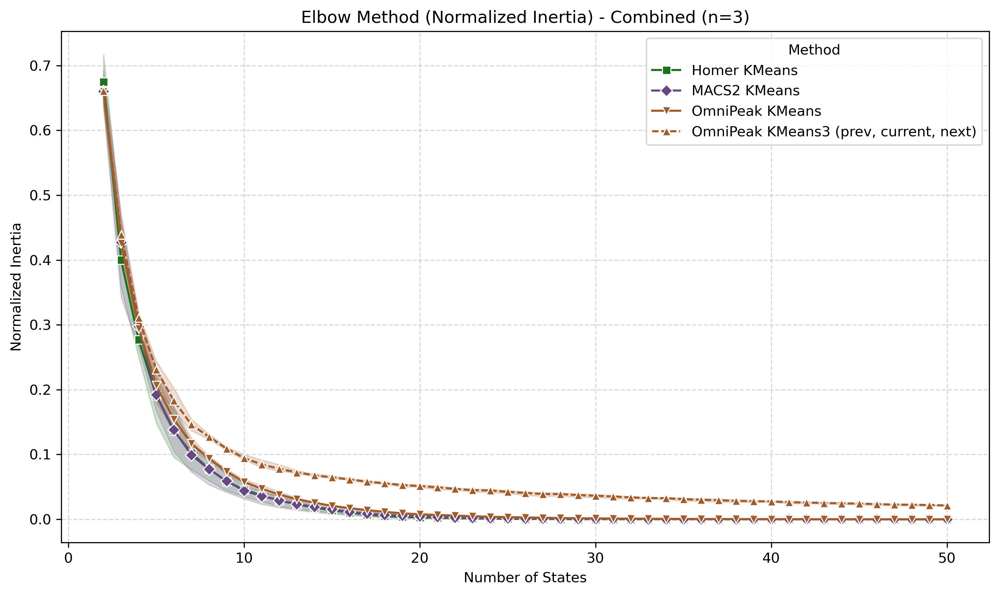

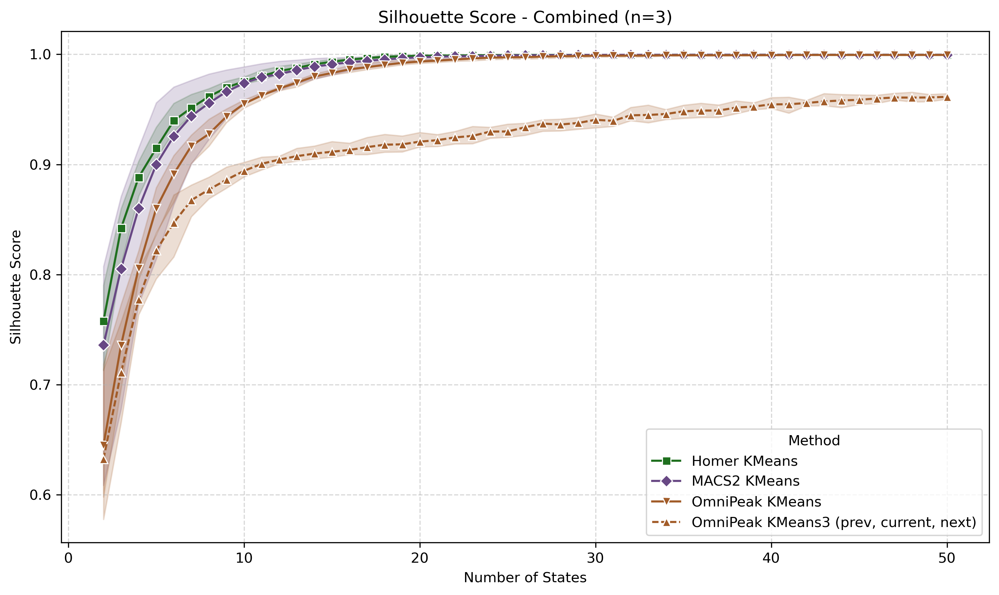

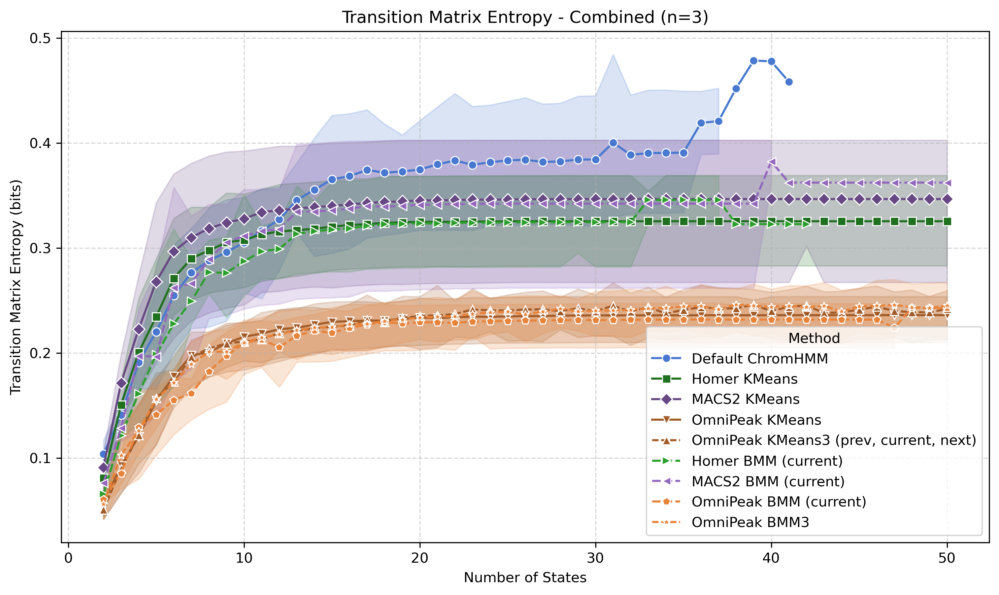

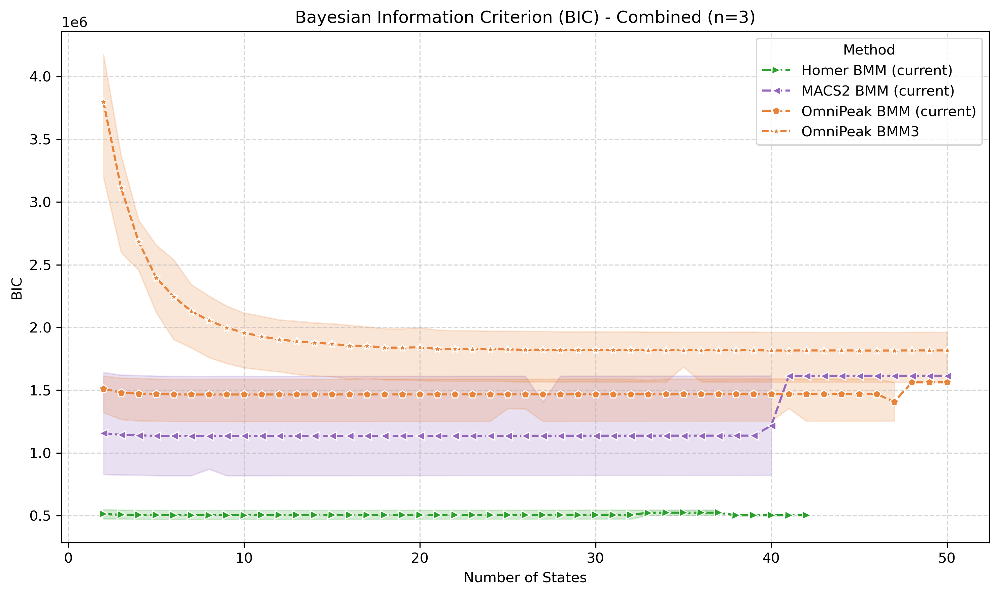

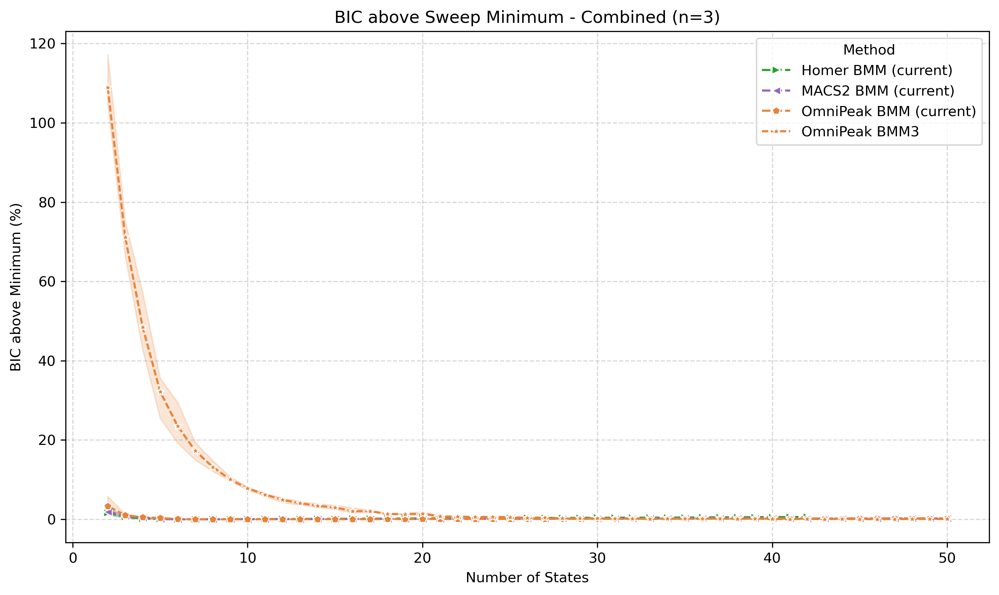

...

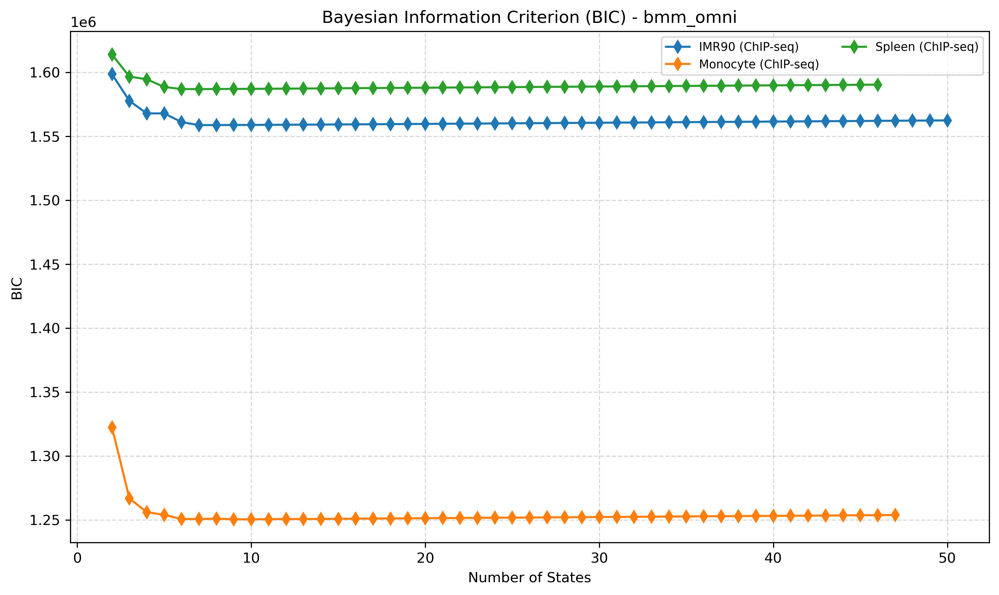

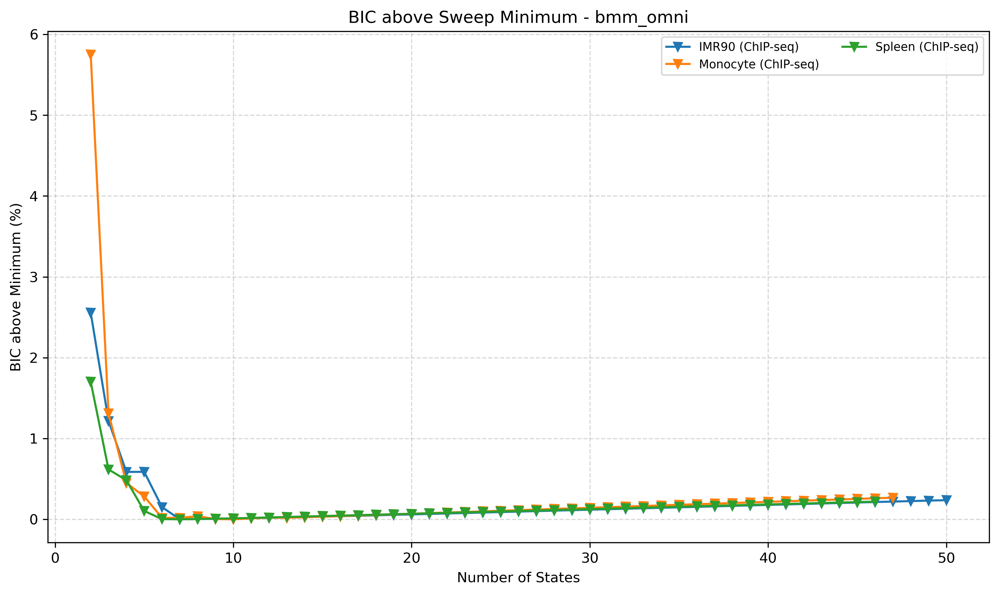

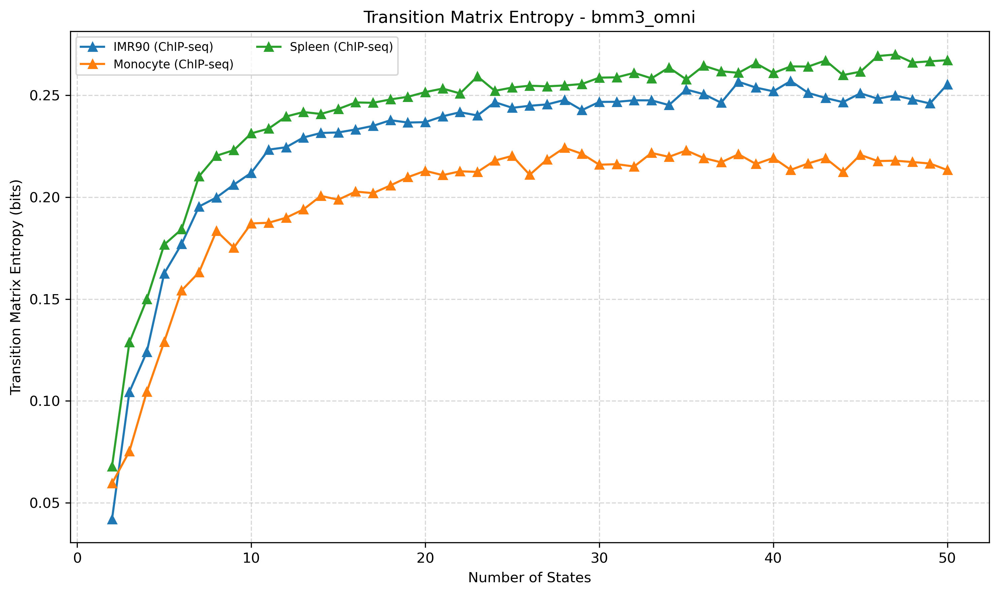

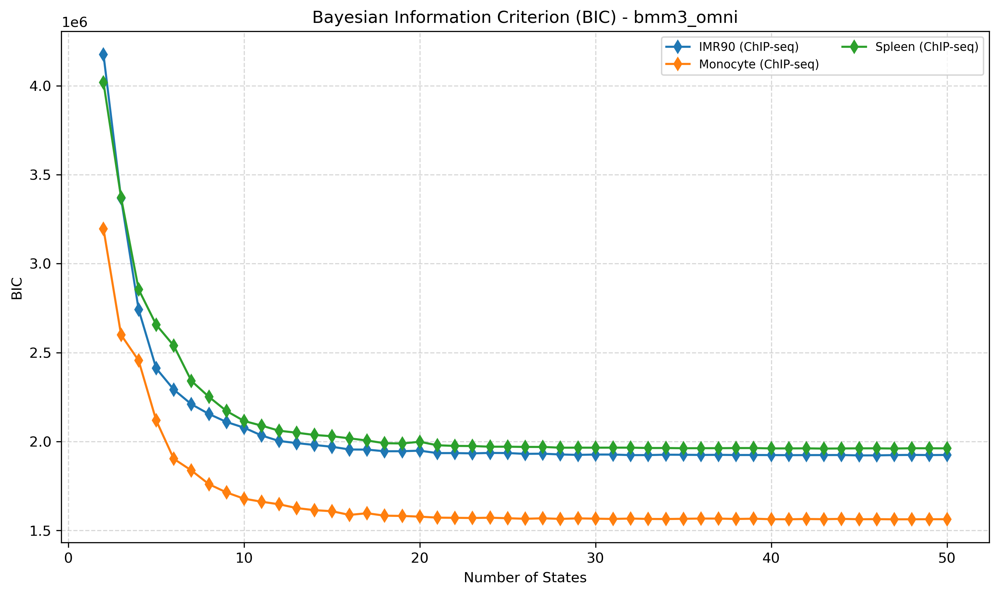

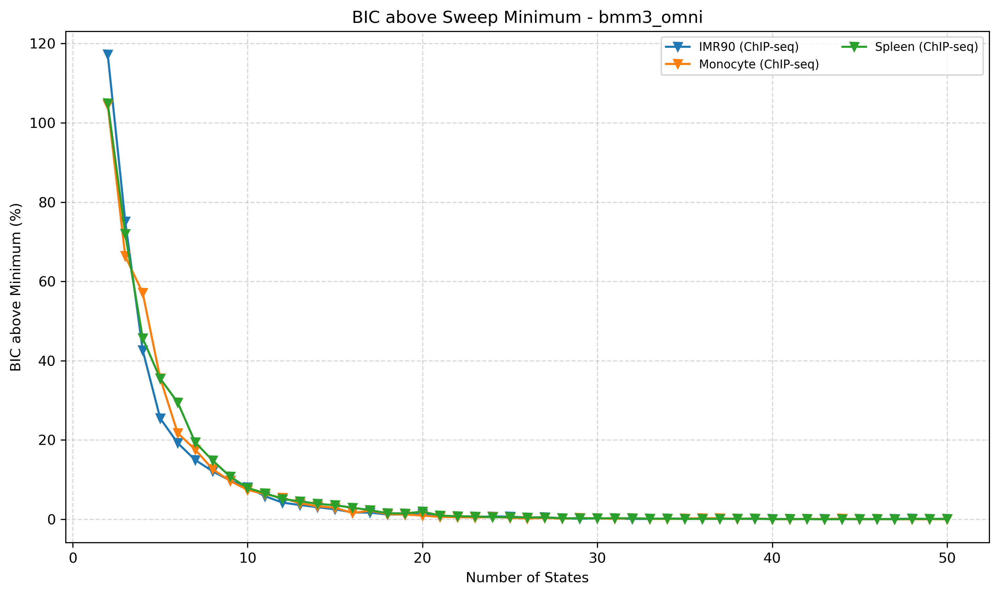

In [8]:
# 1.3 Display
show_group("Optimal number of states - combined over the datasets",
           [(f"out/optimal_n_states_{part}.png", f"{title} (mean ± SE)")
            for _, _, title, _, part in SWEEP_PLOTS]
           + [("out/optimal_n_states_actual.png",
               "Actual vs requested number of states (mean ± SE)")],
           width=800, level=2)

for _caller, _method in SWEEP_METHODS:
    _label = sweep_label(_method)
    show_group(f"Optimal number of states - {_label}",
               [(f"out/optimal_n_states_{part}_{_label}.png", f"{title} - {_label}")
                for _, _, title, _, part in SWEEP_PLOTS],
               width=800, level=3)